In [ ]:
import pandas as pd
import re
import nltk
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, roc_auc_score
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense, Dropout, Bidirectional
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from bertopic import BERTopic
from sklearn.feature_extraction.text import CountVectorizer
import random
from wordcloud import WordCloud
from nltk.corpus import stopwords

In [ ]:

nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\PMLS\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\PMLS\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [ ]:

data = pd.read_csv('IMDB Dataset.csv')
print("Dataset Loaded Successfully!")

Dataset Loaded Successfully!


In [ ]:
# create a genre column with random genres
genres = ['Action', 'Drama', 'Comedy', 'Horror', 'Romance', 'Sci-Fi']
data['genre'] = [random.choice(genres) for _ in range(len(data))]

In [ ]:
# Preprocessing Function (cleaning text data)
def preprocess_text(text):
    text = re.sub(r'<.*?>', '', text)  # Remove HTML tags
    text = re.sub(r'[^\w\s]', '', text)  # Remove punctuation
    text = re.sub(r'\d+', '', text)  # Remove numbers
    text = text.lower()  # Convert to lowercase
    stop_words = set(nltk.corpus.stopwords.words('english'))
    text = " ".join(word for word in text.split() if word not in stop_words)
    lemmatizer = nltk.stem.WordNetLemmatizer()
    text = " ".join([lemmatizer.lemmatize(word) for word in text.split()])
    return text

# Apply preprocessing to the reviews
data['cleaned_review'] = data['review'].apply(preprocess_text)

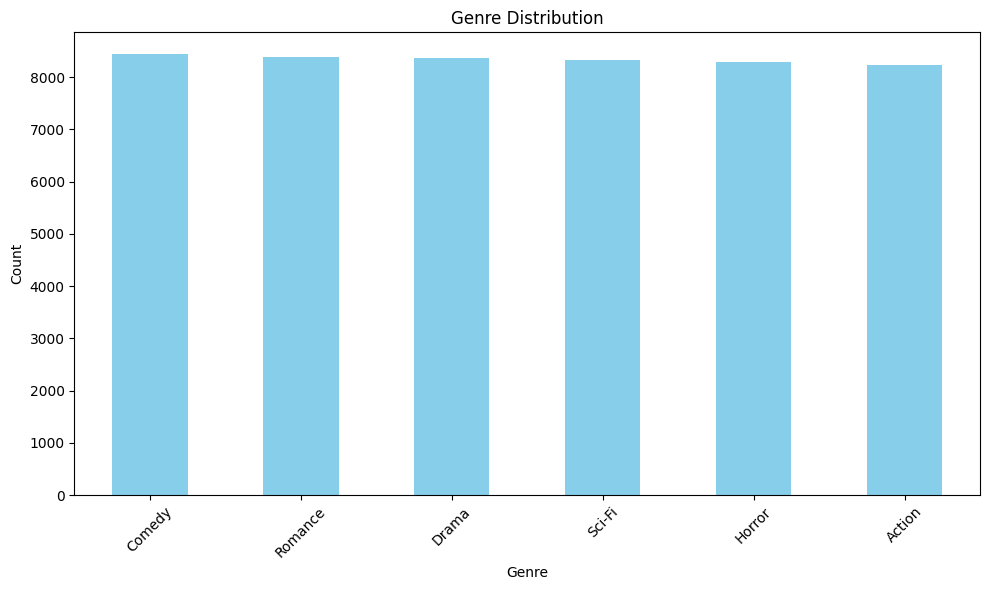

In [ ]:

# Visualizing the distribution of genres
genre_counts = data['genre'].value_counts()
plt.figure(figsize=(10, 6))
genre_counts.plot(kind='bar', color='skyblue')
plt.title('Genre Distribution')
plt.xlabel('Genre')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

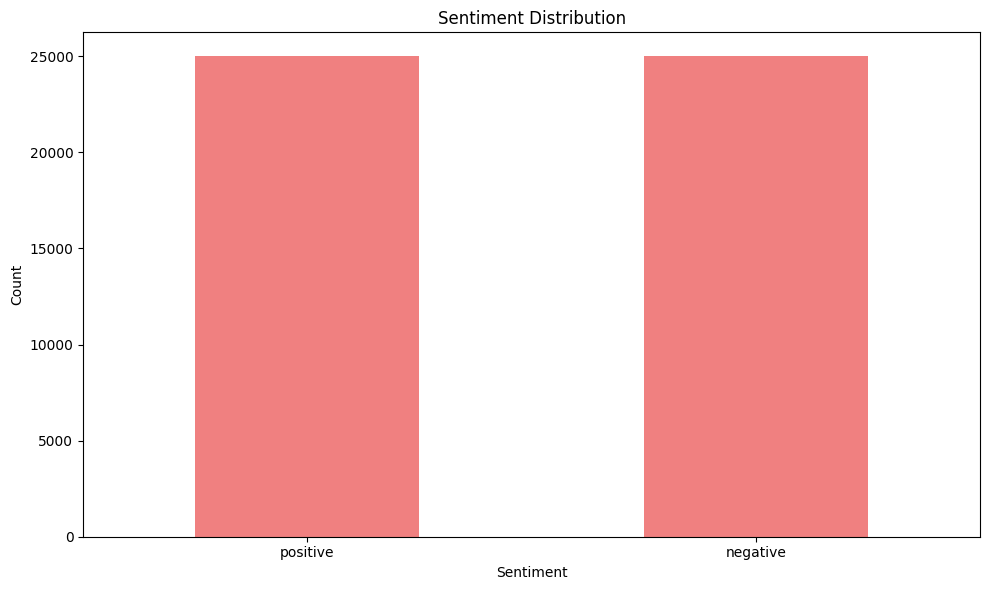

In [ ]:
# Visualizing the distribution of sentiments
sentiment_counts = data['sentiment'].value_counts()
plt.figure(figsize=(10, 6))
sentiment_counts.plot(kind='bar', color='lightcoral')
plt.title('Sentiment Distribution')
plt.xlabel('Sentiment')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

In [ ]:
# Word Cloud of Common Words in Reviews
all_reviews = ' '.join(data['review'])
wordcloud = WordCloud(stopwords=stopwords.words('english'), background_color='white').generate(all_reviews)


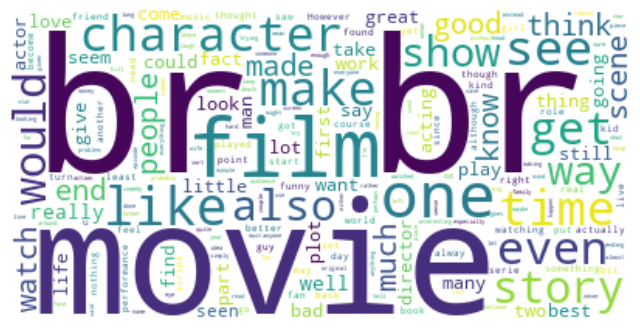

In [ ]:
plt.figure(figsize=(8, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [ ]:

X = data['cleaned_review']
y = data['sentiment'].apply(lambda x: 1 if x == 'positive' else 0)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:

vectorizer = TfidfVectorizer(max_features=5000)
X_train_vec = vectorizer.fit_transform(X_train)
X_test_vec = vectorizer.transform(X_test)

In [ ]:
# Train and evaluate Naive Bayes model
nb_model = MultinomialNB()
nb_model.fit(X_train_vec, y_train)
y_pred = nb_model.predict(X_test_vec)
print("Naive Bayes Model Evaluation")
print(f"Accuracy: {accuracy_score(y_test, y_pred):.4f}")
print(f"Precision: {precision_score(y_test, y_pred):.4f}")
print(f"Recall: {recall_score(y_test, y_pred):.4f}")
print(f"F1 Score: {f1_score(y_test, y_pred):.4f}")
print(f"ROC-AUC Score: {roc_auc_score(y_test, y_pred):.4f}")
print("Classification Report:\n", classification_report(y_test, y_pred))

Naive Bayes Model Evaluation
Accuracy: 0.8495
Precision: 0.8477
Recall: 0.8549
F1 Score: 0.8513
ROC-AUC Score: 0.8495
Classification Report:
               precision    recall  f1-score   support

           0       0.85      0.84      0.85      4961
           1       0.85      0.85      0.85      5039

    accuracy                           0.85     10000
   macro avg       0.85      0.85      0.85     10000
weighted avg       0.85      0.85      0.85     10000



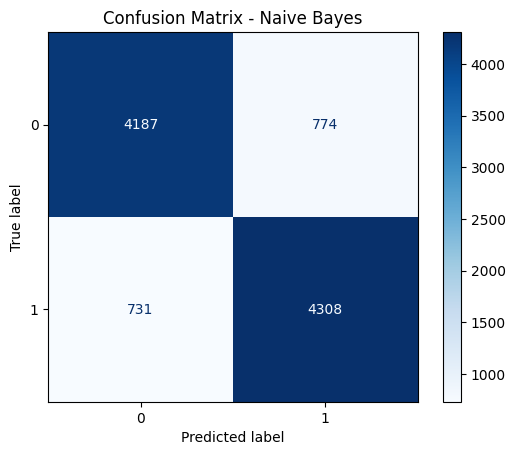

In [ ]:
# Confusion Matrix for Naive Bayes
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])  # 0: Negative, 1: Positive
disp.plot(cmap='Blues')
plt.title("Confusion Matrix - Naive Bayes")
plt.show()

In [ ]:
# Train and evaluate Logistic Regression model
lr_model = LogisticRegression()
lr_model.fit(X_train_vec, y_train)
y_pred_lr = lr_model.predict(X_test_vec)
print("Logistic Regression Model Evaluation")
print(f"Accuracy: {accuracy_score(y_test, y_pred):.4f}")
print(f"Precision: {precision_score(y_test, y_pred):.4f}")
print(f"Recall: {recall_score(y_test, y_pred):.4f}")
print(f"F1 Score: {f1_score(y_test, y_pred):.4f}")
print(f"ROC-AUC Score: {roc_auc_score(y_test, y_pred):.4f}")
print("Classification Report:\n", classification_report(y_test, y_pred))

Logistic Regression Model Evaluation
Accuracy: 0.8495
Precision: 0.8477
Recall: 0.8549
F1 Score: 0.8513
ROC-AUC Score: 0.8495
Classification Report:
               precision    recall  f1-score   support

           0       0.85      0.84      0.85      4961
           1       0.85      0.85      0.85      5039

    accuracy                           0.85     10000
   macro avg       0.85      0.85      0.85     10000
weighted avg       0.85      0.85      0.85     10000



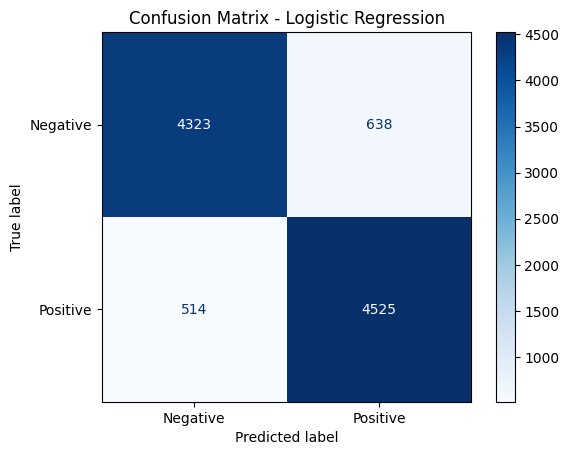

In [ ]:
# Confusion Matrix Visualization for Logistic Regression
y_pred_lr = lr_model.predict(X_test_vec)
cm = confusion_matrix(y_test, y_pred_lr)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Negative', 'Positive'])
disp.plot(cmap='Blues')
plt.title('Confusion Matrix - Logistic Regression')
plt.show()


In [ ]:
# LSTM Model for Sentiment Classification
max_words = 5000
max_len = 200
tokenizer = Tokenizer(num_words=max_words, oov_token='<OOV>')
tokenizer.fit_on_texts(X_train)
X_train_seq = tokenizer.texts_to_sequences(X_train)
X_test_seq = tokenizer.texts_to_sequences(X_test)
X_train_pad = pad_sequences(X_train_seq, maxlen=max_len, padding='post')
X_test_pad = pad_sequences(X_test_seq, maxlen=max_len, padding='post')

In [ ]:
embedding_dim = 100
lstm_model = Sequential([
    Embedding(input_dim=max_words, output_dim=embedding_dim, input_length=max_len),
    Bidirectional(LSTM(64, return_sequences=True)),
    Dropout(0.3),
    Bidirectional(LSTM(64)),
    Dense(64, activation='relu'),
    Dropout(0.3),
    Dense(1, activation='sigmoid')
])

In [ ]:
lstm_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
history = lstm_model.fit(
    X_train_pad, y_train,
    epochs=5,
    batch_size=64,
    validation_data=(X_test_pad, y_test),
    verbose=1
)

Epoch 1/5
625/625 ━━━━━━━━━━━━━━━━━━━━ 138s 216ms/step - accuracy: 0.7493 - loss: 0.4873 - val_accuracy: 0.8500 - val_loss: 0.3227
Epoch 2/5
625/625 ━━━━━━━━━━━━━━━━━━━━ 135s 217ms/step - accuracy: 0.8778 - loss: 0.3010 - val_accuracy: 0.8727 - val_loss: 0.3016
Epoch 3/5
625/625 ━━━━━━━━━━━━━━━━━━━━ 131s 210ms/step - accuracy: 0.9055 - loss: 0.2425 - val_accuracy: 0.8824 - val_loss: 0.2888
Epoch 4/5
625/625 ━━━━━━━━━━━━━━━━━━━━ 132s 212ms/step - accuracy: 0.9215 - loss: 0.2136 - val_accuracy: 0.8785 - val_loss: 0.3110
Epoch 5/5
625/625 ━━━━━━━━━━━━━━━━━━━━ 132s 211ms/step - accuracy: 0.9344 - loss: 0.1791 - val_accuracy: 0.8768 - val_loss: 0.3217


In [ ]:

y_pred_lstm = (lstm_model.predict(X_test_pad) > 0.5).astype("int32")
print("LSTM Model Evaluation")
print(f"Accuracy: {accuracy_score(y_test, y_pred_lstm):.4f}")
print(f"Precision: {precision_score(y_test, y_pred_lstm):.4f}")
print(f"Recall: {recall_score(y_test, y_pred_lstm):.4f}")
print(f"F1 Score: {f1_score(y_test, y_pred_lstm):.4f}")
print("Classification Report:\n", classification_report(y_test, y_pred_lstm))

313/313 ━━━━━━━━━━━━━━━━━━━━ 13s 41ms/step
LSTM Model Evaluation
Accuracy: 0.8768
Precision: 0.8749
Recall: 0.8815
F1 Score: 0.8782
Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.87      0.88      4961
           1       0.87      0.88      0.88      5039

    accuracy                           0.88     10000
   macro avg       0.88      0.88      0.88     10000
weighted avg       0.88      0.88      0.88     10000



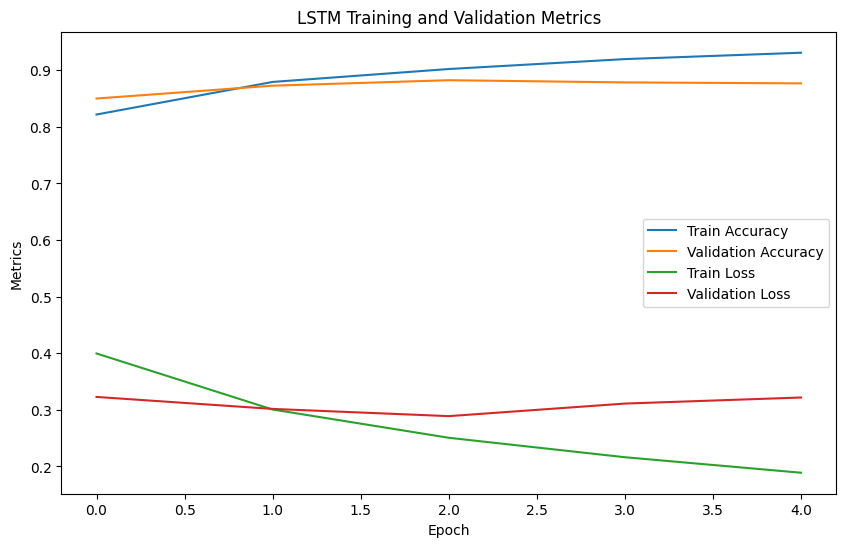

In [ ]:

plt.figure(figsize=(10, 6))
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.title('LSTM Training and Validation Metrics')
plt.xlabel('Epoch')
plt.ylabel('Metrics')
plt.show()

In [ ]:
# Metrics for each model
models = ['Naive Bayes', 'Logistic Regression', 'LSTM']
accuracy = [accuracy_score(y_test, y_pred), accuracy_score(y_test, y_pred_lr), accuracy_score(y_test, y_pred_lstm)]
precision = [precision_score(y_test, y_pred), precision_score(y_test, y_pred_lr), precision_score(y_test, y_pred_lstm)]
recall = [recall_score(y_test, y_pred), recall_score(y_test, y_pred_lr), recall_score(y_test, y_pred_lstm)]
f1 = [f1_score(y_test, y_pred), f1_score(y_test, y_pred_lr), f1_score(y_test, y_pred_lstm)]


In [ ]:
import numpy as np
# Plotting the comparison graph
x = np.arange(len(models))  # The label locations
width = 0.2  # The width of the bars

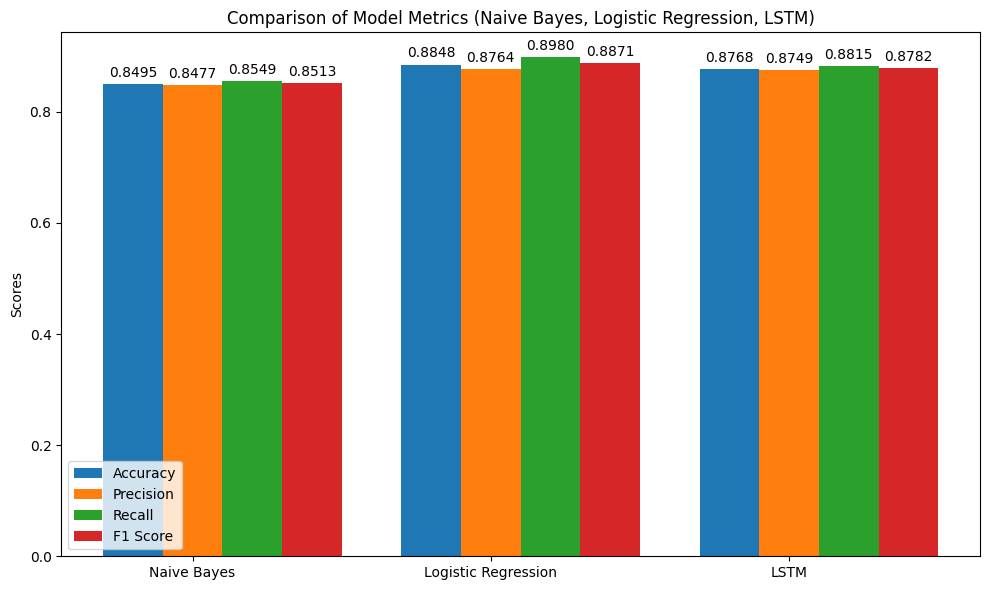

In [ ]:
fig, ax = plt.subplots(figsize=(10, 6))

rects1 = ax.bar(x - width, accuracy, width, label='Accuracy')
rects2 = ax.bar(x, precision, width, label='Precision')
rects3 = ax.bar(x + width, recall, width, label='Recall')
rects4 = ax.bar(x + 2*width, f1, width, label='F1 Score')


ax.set_ylabel('Scores')
ax.set_title('Comparison of Model Metrics (Naive Bayes, Logistic Regression, LSTM)')
ax.set_xticks(x)
ax.set_xticklabels(models)
ax.legend()

#  Display the values on top of the bars
def add_values(rects):
    for rect in rects:
        height = rect.get_height()
        ax.annotate('%.4f' % height,
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

add_values(rects1)
add_values(rects2)
add_values(rects3)
add_values(rects4)

fig.tight_layout()

plt.show()

In [ ]:
# Apply preprocessing to the reviews
data['cleaned_review'] = data['review'].apply(preprocess_text)

In [ ]:
# Topic Modeling with BERTopic
topic_model = BERTopic(
    vectorizer_model=CountVectorizer(stop_words="english"),
    verbose=True
)

In [ ]:
# Fit BERTopic model
topics, probs = topic_model.fit_transform(data['cleaned_review'])
data['topic'] = topics

2024-12-27 19:16:22,187 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/1563 [00:00<?, ?it/s]

2024-12-27 19:33:29,029 - BERTopic - Embedding - Completed ✓
2024-12-27 19:33:29,029 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-12-27 19:33:59,520 - BERTopic - Dimensionality - Completed ✓
2024-12-27 19:33:59,528 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-12-27 19:34:04,023 - BERTopic - Cluster - Completed ✓
2024-12-27 19:34:04,055 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-12-27 19:34:09,585 - BERTopic - Representation - Completed ✓


In [ ]:
# Topic Naming and Interpretation
# Automatically assign names based on representative words
topic_labels = {}
for topic in topic_model.get_topic_info()['Topic']:
    if topic == -1:  # Skip outliers
        continue
    words = ", ".join([word[0] for word in topic_model.get_topic(topic)])
    topic_labels[topic] = f"Topic {topic}: {words}"

# Map topic labels to the dataset
data['topic_label'] = data['topic'].map(topic_labels)

# Visualize the most frequent terms in topics
topic_model.visualize_barchart(top_n_topics=10)


In [ ]:
# Topic-Genre Relationship
topic_genre_dist = data.groupby(['topic_label', 'genre']).size().unstack(fill_value=0)
topic_genre_dist_normalized = topic_genre_dist.div(topic_genre_dist.sum(axis=1), axis=0)


In [ ]:
import plotly.express as px
# Plot Topic-Genre Relationship (Interactive)
fig = px.bar(
    topic_genre_dist_normalized,
    barmode='stack',
    title="Topic Distribution Across Genres",
    labels={'value': 'Proportion', 'topic_label': 'Topic'},
    height=600,
)
fig.update_layout(xaxis={'categoryorder': 'total descending'})
fig.show()

In [ ]:
# Visualizing the top topics
topic_model.visualize_topics()

In [ ]:
# Mapping Topics to Genres
topic_genre_dist = data.groupby(['topic', 'genre']).size().unstack(fill_value=0)
topic_genre_dist_normalized = topic_genre_dist.div(topic_genre_dist.sum(axis=1), axis=0)

<Figure size 1200x800 with 0 Axes>

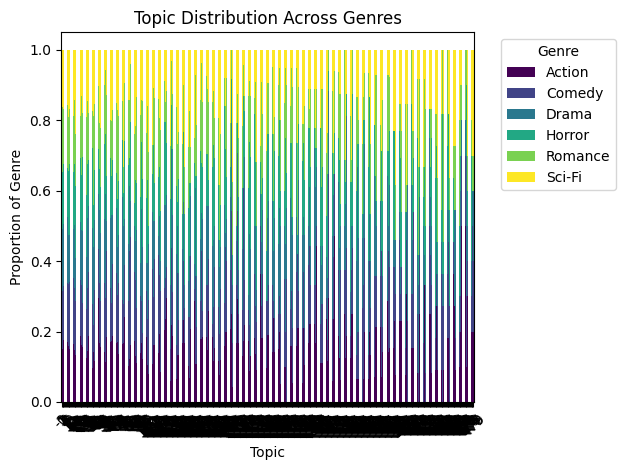

In [ ]:
# Visualizing Topic Distribution Across Genres
plt.figure(figsize=(12, 8))
topic_genre_dist_normalized.plot(kind='bar', stacked=True, colormap='viridis')
plt.title("Topic Distribution Across Genres")
plt.xlabel("Topic")
plt.ylabel("Proportion of Genre")
plt.xticks(rotation=45)
plt.legend(title="Genre", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [ ]:
# Evaluating Topic-Genre Alignment
dominant_genre_per_topic = topic_genre_dist.idxmax(axis=1)
data['predicted_genre'] = data['topic'].map(dominant_genre_per_topic)
print("Genre Prediction Report:")
print(classification_report(data['genre'], data['predicted_genre'], zero_division=0))

Genre Prediction Report:
              precision    recall  f1-score   support

      Action       0.23      0.10      0.14      8230
      Comedy       0.18      0.68      0.28      8433
       Drama       0.26      0.10      0.14      8360
      Horror       0.24      0.09      0.13      8279
     Romance       0.23      0.11      0.15      8375
      Sci-Fi       0.24      0.10      0.14      8323

    accuracy                           0.20     50000
   macro avg       0.23      0.20      0.16     50000
weighted avg       0.23      0.20      0.16     50000



Index(['Topic', 'Count', 'Name', 'Representation', 'Representative_Docs'], dtype='object')
Topic                                                                 -1
Count                                                              29459
Name                                              -1_movie_film_like_bad
Representation         [movie, film, like, bad, good, time, really, c...
Representative_Docs    [okay wasnt worst movie ive ever seen heard lo...
Name: 0, dtype: object
Topic                                                                  0
Count                                                                964
Name                                                0_car_guy_scene_like
Representation         [car, guy, scene, like, cop, know, thing, char...
Representative_Docs    [im going say first given film thought going g...
Name: 1, dtype: object
Topic                                                                  1
Count                                                       

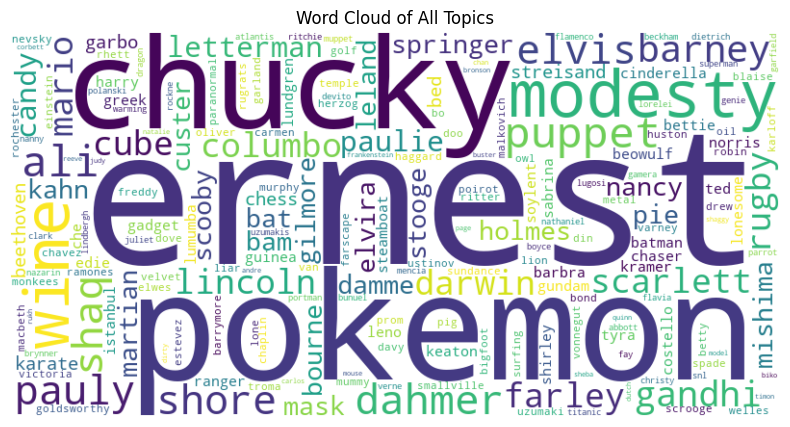

In [ ]:
# Get topic info
topic_info = topic_model.get_topic_info()

# Check column names to understand the structure of the DataFrame
print(topic_info.columns)

# Combine words from all topics excluding outliers
combined_words = {}
for _, row in topic_info.iterrows():
    print(row)
    topic = row['Topic']  # Update with the correct column name
    if topic == -1:  # Skip outliers
        continue
    words = dict(topic_model.get_topic(topic))
    combined_words.update(words)  # Combine words from each topic

wc = WordCloud(background_color="white", width=800, height=400)
wc.generate_from_frequencies(combined_words)

plt.figure(figsize=(10, 5))
plt.imshow(wc, interpolation="bilinear")
plt.axis("off")
plt.title("Word Cloud of All Topics")
plt.show()


In [ ]:

topic_model.visualize_distribution(probs)

In [ ]:

topic_info = topic_model.get_topic_info()
print("Topic Information:\n", topic_info)

Topic Information:
      Topic  Count                                           Name  \
0       -1  29459                         -1_movie_film_like_bad   
1        0    964                           0_car_guy_scene_like   
2        1    725                      1_worst_seen_ive_horrible   
3        2    624                  2_bollywood_indian_khan_india   
4        3    578                       3_french_paris_le_france   
..     ...    ...                                            ...   
476    475     10       475_skit_underground_worsegot_laughsvery   
477    476     10  476_slavic_lamarr_cheapoverall_halfarticulate   
478    477     10             477_spielberg_seller_purple_coward   
479    478     10               478_freebird_trinians_phil_welsh   
480    479     10             479_rugrats_zorak_screwedthis_kimi   

                                        Representation  \
0    [movie, film, like, bad, good, time, really, c...   
1    [car, guy, scene, like, cop, know, thing, 

In [ ]:
# Visualizing topic clusters and relationships
topic_model.visualize_hierarchy()

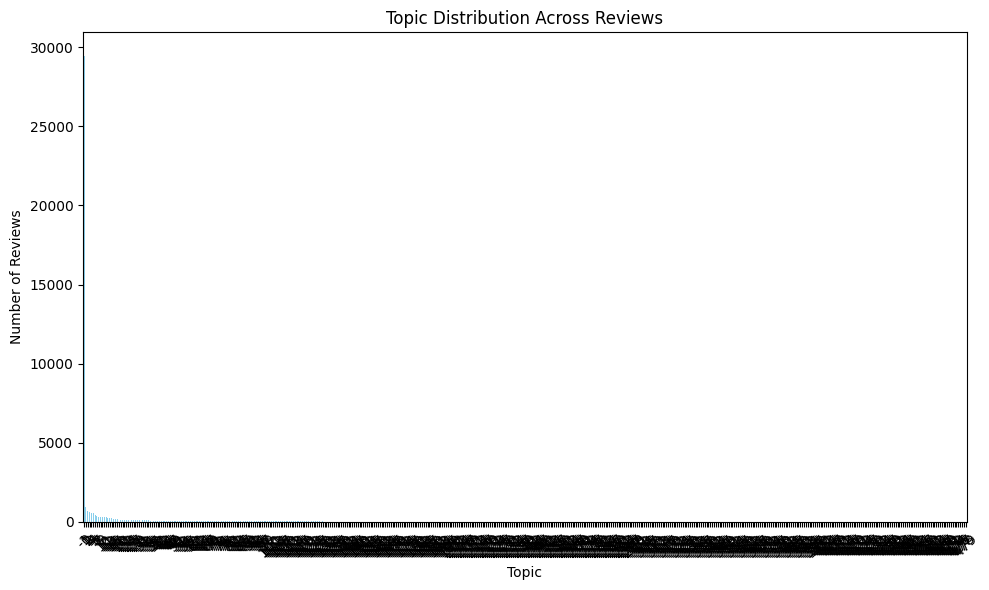

In [ ]:
# Exploring Topics per Document
topics_overview = topic_model.get_document_info(data['cleaned_review'])
topics_overview['Topic'].value_counts().plot(kind='bar', color='skyblue', figsize=(10, 6))
plt.title('Topic Distribution Across Reviews')
plt.xlabel('Topic')
plt.ylabel('Number of Reviews')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

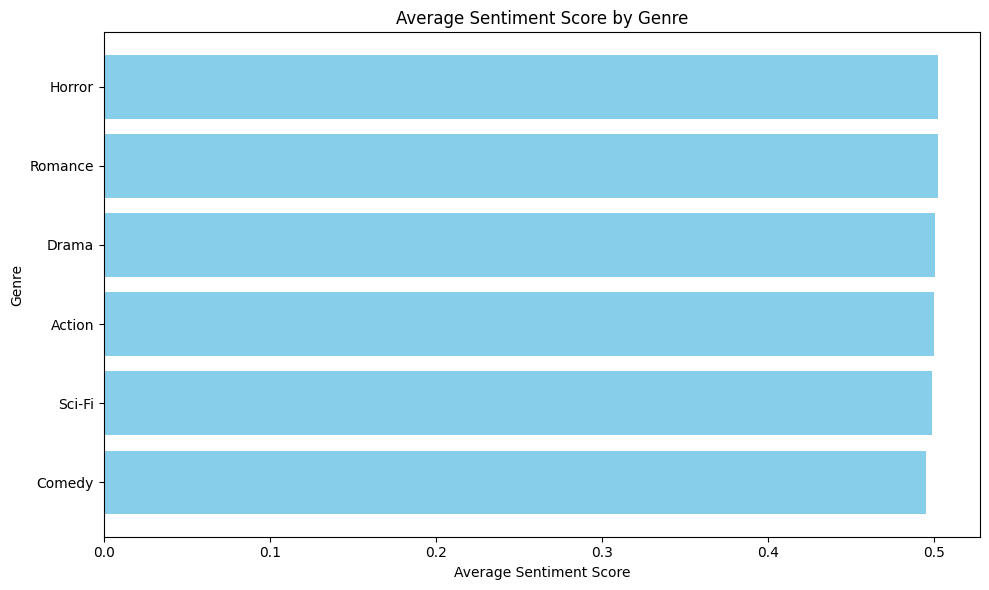

In [ ]:
data['sentiment_score'] = data['sentiment'].apply(lambda x: 1 if x == 'positive' else 0)

genre_sentiment = data.groupby('genre')['sentiment_score'].mean().reset_index()

genre_sentiment = genre_sentiment.sort_values(by='sentiment_score', ascending=False)

# Visualizing Best and Worst Genres by Average Sentiment
plt.figure(figsize=(10, 6))
plt.barh(genre_sentiment['genre'], genre_sentiment['sentiment_score'], color='skyblue')
plt.title('Average Sentiment Score by Genre')
plt.xlabel('Average Sentiment Score')
plt.ylabel('Genre')
plt.gca().invert_yaxis()  # Highest sentiment scores at the top
plt.tight_layout()
plt.show()

In [ ]:
# Identify top 5 best-reviewed movies by genre
best_reviews = data[data['sentiment'] == 'positive'].groupby('genre').apply(
    lambda x: x.nlargest(5, 'sentiment_score')
).reset_index(drop=True)

C:\Users\PMLS\AppData\Local\Temp\ipykernel_55100\930829065.py:2: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



In [ ]:
# Identify top 5 worst-reviewed movies by genre
worst_reviews = data[data['sentiment'] == 'negative'].groupby('genre').apply(
    lambda x: x.nlargest(5, 'sentiment_score')  # Keeps format consistent, although all are 0 for negatives
).reset_index(drop=True)

C:\Users\PMLS\AppData\Local\Temp\ipykernel_55100\1014246729.py:2: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



In [ ]:

print("Best Reviewed Movies by Genre:")
print(best_reviews[['genre', 'review']])



Best Reviewed Movies by Genre:
      genre                                             review
0    Action  One of the other reviewers has mentioned that ...
1    Action  Some films just simply should not be remade. T...
2    Action  After the success of Die Hard and it's sequels...
3    Action  What an absolutely stunning movie, if you have...
4    Action  One of the most significant quotes from the en...
5    Comedy  Petter Mattei's "Love in the Time of Money" is...
6    Comedy  If anyone is wondering why no one makes movies...
7    Comedy  So well made, no CGI crap. Has anyone else bee...
8    Comedy  I just watched this movie on it's premier nigh...
9    Comedy  What seemed at first just another introverted ...
10    Drama  I thought this was a wonderful way to spend ti...
11    Drama  This a fantastic movie of three prisoners who ...
12    Drama  I remember this film,it was the first film i h...
13    Drama  This movie struck home for me. Being 29, I rem...
14    Drama  ***SPOILERS

In [ ]:
print("\nWorst Reviewed Movies by Genre:")
print(worst_reviews[['genre', 'review']])


Worst Reviewed Movies by Genre:
      genre                                             review
0    Action  So im not a big fan of Boll's work but then ag...
1    Action  Of all the films I have seen, this one, The Ra...
2    Action  What happened? What we have here is basically ...
3    Action  I've just watched Fingersmith, and I'm stunned...
4    Action  "Fate" leads Walter Sparrow to come in possess...
5    Comedy  Encouraged by the positive comments about this...
6    Comedy  I saw this movie when I was about 12 when it c...
7    Comedy  This film tried to be too many things all at o...
8    Comedy  After sitting through this pile of dung, my hu...
9    Comedy  I had heard good things about "States of Grace...
10    Drama  This show was an amazing, fresh & innovative i...
11    Drama  My first exposure to the Templarios & not a go...
12    Drama  How this film could be classified as Drama, I ...
13    Drama  Average (and surprisingly tame) Fulci giallo w...
14    Drama  This film